In [1]:
#### importing original data ####
import matplotlib.pyplot as plt
import pandas as pd
import numpy as np 
import seaborn as sns 
import re 
%matplotlib inline
import glob
from tqdm import tqdm


# Jump down to later checkpoints

## Grade classification for all patients


## split patients

# Checkpoint 1

## here I am normalizing the data ROI by ROI

In [3]:
full_df = pd.read_csv('/scratch/gh8sj/brown_nsclc/data/processed_data/grade_data_TS_labeled_with_neighbors.csv', index_col = 0)

In [4]:
list(full_df.columns);

# first normalizing with center and neigbor

In [5]:
full_df

,Slide Index,ImageLocation,XMin,XMax,YMin,YMax,MHCI,CD56,CD8,CD3,...,CD56+CD3-IFNy- Stroma Neighbors_200um,CD56+CD3-IFNy- Glass Neighbors_200um,PanCyto+MHCI+ Tumor Neighbors_200um,PanCyto+MHCI+ Stroma Neighbors_200um,PanCyto+MHCI+ Glass Neighbors_200um,PanCyto+MHCI- Tumor Neighbors_200um,PanCyto+MHCI- Stroma Neighbors_200um,PanCyto+MHCI- Glass Neighbors_200um,stage,cell_type
0,0,E:\BROWN RESCAN 11.8.19\Rescan Images 11.11.19...,1988.62576,1996.53872,72.20576,80.11872,0.0,0.0,1.0,0.0,...,0.0,0.0,24.0,0.0,0.0,164.0,0.0,0.0,early,PanCyto-CD56-
1,1,E:\BROWN RESCAN 11.8.19\Rescan Images 11.11.19...,2000.49520,2006.92448,172.10688,181.00896,0.0,0.0,0.0,0.0,...,0.0,0.0,36.0,0.0,0.0,228.0,0.0,0.0,early,PanCyto-CD56-
2,2,E:\BROWN RESCAN 11.8.19\Rescan Images 11.11.19...,1999.01152,2008.40816,297.23056,304.64896,0.0,0.0,0.0,0.0,...,0.0,0.0,40.0,0.0,0.0,222.0,0.0,0.0,early,PanCyto-CD56-
3,3,E:\BROWN RESCAN 11.8.19\Rescan Images 11.11.19...,1982.19648,1991.59312,372.89824,381.30576,0.0,0.0,0.0,0.0,...,0.0,0.0,90.0,4.0,0.0,194.0,0.0,0.0,early,PanCyto-CD56-
4,4,E:\BROWN RESCAN 11.8.19\Rescan Images 11.11.19...,2003.46256,2008.90272,374.87648,382.29488,0.0,0.0,0.0,0.0,...,0.0,0.0,80.0,4.0,0.0,184.0,0.0,0.0,early,PanCyto-CD56-
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5255948,2722,E:\Brown 4.25.19\Unmixed Images 4.29.19\MAD17-...,238.37792,244.31264,370.92000,379.82208,0.0,0.0,0.0,1.0,...,0.0,0.0,70.0,3.0,0.0,166.0,2.0,0.0,late,CD3+CD8-IFNy-
5255949,2723,E:\Brown 4.25.19\Unmixed Images 4.29.19\MAD17-...,225.02480,231.45408,371.90912,382.29488,0.0,0.0,1.0,0.0,...,0.0,0.0,66.0,3.0,0.0,159.0,2.0,0.0,late,PanCyto-CD56-
5255950,2724,E:\Brown 4.25.19\Unmixed Images 4.29.19\MAD17-...,212.66080,219.58464,373.39280,380.81120,0.0,0.0,0.0,0.0,...,0.0,0.0,69.0,3.0,0.0,156.0,2.0,0.0,late,PanCyto-CD56-
5255951,2725,E:\Brown 4.25.19\Unmixed Images 4.29.19\MAD17-...,230.95952,234.91600,372.89824,381.80032,0.0,0.0,0.0,0.0,...,0.0,0.0,66.0,3.0,0.0,162.0,2.0,0.0,late,PanCyto-CD56-


In [13]:
#this distinguishes by center cell locatin
#def flatten_list(nested_list):
#    flat_list = []
#    for item in nested_list:
#        if isinstance(item, list):
#            flat_list.extend(flatten_list(item))
#        else:
#            flat_list.append(item)
#    return flat_list

def flatten_list(nested_list):
    flat_list = []
    for item in nested_list:
        if isinstance(item, list):
            flat_list.extend(item)
        else:
            flat_list.append(item)
    return flat_list

full_df = full_df.loc[full_df['ClassifierLabel'] != 'glass']

cell_types = ['PanCyto+MHCI+', 'PanCyto+MHCI-',
       'CD3+CD8+IFNy+', 'CD3+CD8+IFNy-', 'CD3+CD8-IFNy+', 'CD3+CD8-IFNy-',
       'CD56+CD3-IFNy+', 'CD56+CD3-IFNy-']
cancer_cells = ['PanCyto+MHCI+', 'PanCyto+MHCI-']

cd8s =['CD3+CD8+IFNy+', 'CD3+CD8+IFNy-']
cd3s = ['CD3+CD8-IFNy+', 'CD3+CD8-IFNy-']
NK  =  ['CD56+CD3-IFNy+', 'CD56+CD3-IFNy-']
tumor = ['PanCyto+MHCI+', 'PanCyto+MHCI-' ]
neighbors = ['CD3+CD8+IFNy+ Tumor Neighbors_30um','CD3+CD8+IFNy+ Stroma Neighbors_30um','CD3+CD8+IFNy- Tumor Neighbors_30um','CD3+CD8+IFNy- Stroma Neighbors_30um',
             'CD3+CD8-IFNy+ Tumor Neighbors_30um','CD3+CD8-IFNy+ Stroma Neighbors_30um','CD3+CD8-IFNy- Tumor Neighbors_30um','CD3+CD8-IFNy- Stroma Neighbors_30um',
             'CD56+CD3-IFNy+ Tumor Neighbors_30um','CD56+CD3-IFNy+ Stroma Neighbors_30um','CD56+CD3-IFNy- Tumor Neighbors_30um','CD56+CD3-IFNy- Stroma Neighbors_30um',
             'PanCyto+MHCI+ Tumor Neighbors_30um','PanCyto+MHCI+ Stroma Neighbors_30um','PanCyto+MHCI- Tumor Neighbors_30um','PanCyto+MHCI- Stroma Neighbors_30um',  
             'CD3+CD8+IFNy+ Tumor Neighbors_200um','CD3+CD8+IFNy+ Stroma Neighbors_200um','CD3+CD8+IFNy- Tumor Neighbors_200um','CD3+CD8+IFNy- Stroma Neighbors_200um',
             'CD3+CD8-IFNy+ Tumor Neighbors_200um','CD3+CD8-IFNy+ Stroma Neighbors_200um','CD3+CD8-IFNy- Tumor Neighbors_200um','CD3+CD8-IFNy- Stroma Neighbors_200um',
             'CD56+CD3-IFNy+ Tumor Neighbors_200um','CD56+CD3-IFNy+ Stroma Neighbors_200um','CD56+CD3-IFNy- Tumor Neighbors_200um','CD56+CD3-IFNy- Stroma Neighbors_200um',
             'PanCyto+MHCI+ Tumor Neighbors_200um','PanCyto+MHCI+ Stroma Neighbors_200um','PanCyto+MHCI- Tumor Neighbors_200um','PanCyto+MHCI- Stroma Neighbors_200um']

locations = list(full_df['ClassifierLabel'].unique())
results_dict = {}
unique_patients = full_df['ROI'].unique()
for patient_num in tqdm(range(len(unique_patients))):
    patient = unique_patients[patient_num]
    patient_data = full_df[full_df['ROI'] == patient]
    patient_stats = []
    for location in locations:    
        if location in patient_data['ClassifierLabel'].unique():
            #print(location)
            location_data  = patient_data.loc[patient_data['ClassifierLabel'] == location]
  
            location_stats = []
            # Subset the dataframe for the current patient

            patient_code = list(location_data.PatientID.unique())[0]
            ###
            cd8s = location_data.loc[location_data['CD3+CD8+'] == 1.0]
            if len(cd8s != 0):
                cd8_ifng_pos = sum(cd8s['CD3+CD8+IFNy+'] == 1.0)/(sum(cd8s['CD3+CD8+IFNy+'] == 1.0)+sum(cd8s['CD3+CD8+IFNy-'] == 1.0))
            else:
                cd8_ifng_pos = 0

            cd8s_act = location_data.loc[location_data['CD3+CD8+IFNy+'] == 1.0]
            if len(cd8s_act != 0):
                cd8_act_neighbor_counts = (cd8s_act[neighbors].sum(axis=0).values/len(cd8s_act)).tolist()
            else:
                cd8_act_neighbor_counts = np.zeros(len(neighbors)).tolist()

            cd8s_inact = location_data.loc[location_data['CD3+CD8+IFNy-'] == 1.0]
            if len(cd8s_inact != 0):
                cd8_inact_neighbor_counts = (cd8s_inact[neighbors].sum(axis=0).values/len(cd8s_inact)).tolist()
            else:
                cd8_inact_neighbor_counts = np.zeros(len(neighbors)).tolist()
            ###    
            cd3s = location_data.loc[location_data['CD3+CD8-'] == 1.0]
            if len(cd3s) != 0:
                cd3_ifng_pos = sum(cd3s['CD3+CD8-IFNy+'] == 1.0)/(sum(cd3s['CD3+CD8-IFNy+'] == 1.0)+sum(cd3s['CD3+CD8-IFNy-'] == 1.0))
            else:
                cd3_ifng_pos = 0

            cd3s_act = location_data.loc[location_data['CD3+CD8-IFNy+'] == 1.0]
            if len(cd3s_act) != 0:
                cd3_act_neighbor_counts = (cd3s_act[neighbors].sum(axis = 0).values/len(cd3s_act)).tolist()
            else:
                cd3_act_neighbor_counts = np.zeros(len(neighbors)).tolist()  

            cd3s_inact = location_data.loc[location_data['CD3+CD8-IFNy-'] == 1.0]
            if len(cd3s_act) != 0:
                cd3_inact_neighbor_counts = (cd3s_inact[neighbors].sum(axis = 0).values/len(cd3s_inact)).tolist()
            else:
                cd3_inact_neighbor_counts = np.zeros(len(neighbors)).tolist() 

            nks = location_data.loc[location_data['CD56+CD3-'] == 1.0]
            if len(nks) != 0:
                nk_ifng_pos = sum(nks['CD56+CD3-IFNy+'] == 1.0)/(sum(nks['CD56+CD3-IFNy+'] == 1.0)+sum(nks['CD56+CD3-IFNy-'] == 1.0))
            else:
                nk_ifng_pos = 0

            nks_act = location_data.loc[location_data['CD56+CD3-IFNy+'] == 1.0]
            if len(nks_act) != 0:
                nk_act_neighbor_counts = (nks_act[neighbors].sum(axis = 0).values/len(nks_act)).tolist()
            else:
                nk_act_neighbor_counts = np.zeros(len(neighbors)).tolist()      

            nks_inact = location_data.loc[location_data['CD56+CD3-IFNy-'] == 1.0]
            if len(nks_inact) != 0:
                nk_inact_neighbor_counts = (nks_inact[neighbors].sum(axis = 0).values/len(nks_inact)).tolist()
            else:
                nk_inact_neighbor_counts = np.zeros(len(neighbors)).tolist()            

            tumor = location_data.loc[(location_data['PanCyto+MHCI+'] == 1.0)| (location_data['PanCyto+MHCI-'] == 1.0)]
            if len(tumor) != 0:
                tumor_mhci_pos = sum(tumor['PanCyto+MHCI+'] == 1.0)/(sum(tumor['PanCyto+MHCI+'] == 1.0)+sum(tumor['PanCyto+MHCI-'] == 1.0))
            else:
                tumor_mhci_pos = 0

            tumor_mhc1p = location_data.loc[(location_data['PanCyto+MHCI+'] == 1.0)]
            if len(tumor_mhc1p) != 0:
                tumor_mhc1p_neighbor_counts = (tumor_mhc1p[neighbors].sum(axis = 0).values/len(tumor_mhc1p)).tolist()
            else:
                tumor_mhc1p_neighbor_counts = np.zeros(len(neighbors)).tolist()

            tumor_mhc1n = location_data.loc[(location_data['PanCyto+MHCI-'] == 1.0)]
            if len(tumor_mhc1n) != 0:
                tumor_mhc1n_neighbor_counts = (tumor_mhc1n[neighbors].sum(axis = 0).values/len(tumor_mhc1n)).tolist()
            else:
                tumor_mhc1n_neighbor_counts = np.zeros(len(neighbors)).tolist()  
                
            location_stats.extend([location, cd8_ifng_pos, len(cd8s), cd3_ifng_pos, len(cd3s), nk_ifng_pos, len(nks), tumor_mhci_pos, len(tumor)])
            full_location_stats = location_stats + cd8_act_neighbor_counts + cd8_inact_neighbor_counts + cd3_act_neighbor_counts + cd3_inact_neighbor_counts + nk_act_neighbor_counts + nk_inact_neighbor_counts + tumor_mhc1p_neighbor_counts+ tumor_mhc1n_neighbor_counts
        patient_stats.extend([full_location_stats])
    group = location_data['stage'].value_counts().index[0]
    flattened_patient_stats = [item if not isinstance(item, list) else [subitem for subitem in item] for sublist in patient_stats for item in sublist]
    flattened_patient_stats.extend([group, patient_code])
    #patients_stats = flatten_list(patient_stats)
    #patient_stats.extend([cd8_ifng_pos, len(cd8s), cd3_ifng_pos, len(cd3s), nk_ifng_pos, len(nks), tumor_mhci_pos, len(tumor), group, patient_code])
            #patient_stats.extend([cd8_ifng_pos, cd8_neighbor_counts, cd3_ifng_pos, cd3_neighbor_counts,nk_ifng_pos, nk_neighbor_counts, tumor_mhci_pos, tumor_neighbor_counts, mutation])
    results_dict[patient] = flattened_patient_stats

100%|██████████| 412/412 [01:29<00:00,  4.59it/s]


In [14]:
#for distinguishing center cells
def flatten_list(nested_list):
    flat_list = []
    for item in nested_list:
        if isinstance(item, list):
            flat_list.extend(flatten_list(item))
        else:
            flat_list.append(item)
    return flat_list

index_list = []
index_list.append(['Location', 'CD8 IFNg+ %' ,'Number of CD8s','CD3 IFNg+ %', 'Number of CD3s','NK IFNg+ %',  'Number of NKs', 'Tumor cell MHC1+ %', 'Number of Tumor cells', ['CD8 act ' + value for value in neighbors],['CD8 inact ' + value for value in neighbors],['CD3 act ' + value for value in neighbors],['CD3 inact ' + value for value in neighbors], ['NK act ' + value for value in neighbors], ['NK inact ' + value for value in neighbors],['MHC1+ Tumor ' + value for value in neighbors],['MHC1- Tumor ' + value for value in neighbors]])
tumor_prefixed = [['tumor ' + item if not isinstance(item, list) else ['tumor ' + subitem for subitem in item] for item in sublist] for sublist in index_list]
stroma_prefixed = [['stroma ' + item if not isinstance(item, list) else ['stroma ' + subitem for subitem in item] for item in sublist] for sublist in index_list]
doubled_index_list = tumor_prefixed + stroma_prefixed
new_index = [item for sublist in doubled_index_list for item in sublist]
flat_list = flatten_list(new_index)
flat_list.extend(['stage', 'patient'])
results_df = pd.DataFrame(results_dict).T
results_df.columns= flat_list

# now remove the location columns used to track the counting
columns_to_remove = [col for col in results_df.columns if col.endswith('Location')]
results_df = results_df.drop(columns=columns_to_remove)
results_df
# add these back


,tumor CD8 IFNg+ %,tumor Number of CD8s,tumor CD3 IFNg+ %,tumor Number of CD3s,tumor NK IFNg+ %,tumor Number of NKs,tumor Tumor cell MHC1+ %,tumor Number of Tumor cells,tumor CD8 act CD3+CD8+IFNy+ Tumor Neighbors_30um,tumor CD8 act CD3+CD8+IFNy+ Stroma Neighbors_30um,...,stroma MHC1- Tumor CD56+CD3-IFNy+ Tumor Neighbors_200um,stroma MHC1- Tumor CD56+CD3-IFNy+ Stroma Neighbors_200um,stroma MHC1- Tumor CD56+CD3-IFNy- Tumor Neighbors_200um,stroma MHC1- Tumor CD56+CD3-IFNy- Stroma Neighbors_200um,stroma MHC1- Tumor PanCyto+MHCI+ Tumor Neighbors_200um,stroma MHC1- Tumor PanCyto+MHCI+ Stroma Neighbors_200um,stroma MHC1- Tumor PanCyto+MHCI- Tumor Neighbors_200um,stroma MHC1- Tumor PanCyto+MHCI- Stroma Neighbors_200um,stage,patient
"17-185_[46209,14980]",0.0,150,0.0,540,0.0,112,0.317752,3594,0.0,0.0,...,0.0,0.0,6.0,0.0,42.5,14.0,235.5,7.0,early,17-185
"17-185_[46405,13480]",0.008403,238,0.0,528,0.0,228,0.133117,6776,1.0,0.0,...,0.0,0.0,18.0,3.142857,36.0,3.714286,376.0,2.142857,early,17-185
"17-185_[46736,11980]",0.0,184,0.0,514,0.0,680,0.109358,7352,0.0,0.0,...,0.0,0.0,11.333333,0.0,31.333333,1.333333,201.333333,1.0,early,17-185
"17-185_[47168,10480]",0.0,8,0.0,76,0.0,22,0.240506,1106,0.0,0.0,...,0.0,0.0,0.0,0.0,18.0,12.0,86.0,1.0,early,17-185
"17-185_[48216,14980]",0.0,540,0.0,1848,0.0,556,0.184507,15078,0.0,0.0,...,0.0,0.0,13.62963,1.037037,192.37037,10.666667,492.296296,7.518519,early,17-185
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"17-536_[47032,15356]",0.083333,84,0.024952,521,0.153846,13,0.4377,1565,2.571429,0.0,...,0.029412,0.009804,0.77451,1.892157,63.117647,19.45098,92.872549,12.098039,late,17-536
"17-536_[47032,16856]",0.025,40,0.002688,372,0.666667,9,0.46443,1490,0.0,0.0,...,0.389831,0.067797,0.169492,0.016949,53.644068,32.525424,83.983051,8.915254,late,17-536
"17-536_[49039,10345]",0.0,34,0.0,231,0.0,21,0.233633,3116,0.0,0.0,...,0.0,0.0,0.75,0.166667,39.333333,3.916667,114.666667,1.5,late,17-536
"17-536_[49039,11845]",0.0,42,0.0,248,0.0,30,0.236631,3123,0.0,0.0,...,0.0,0.0,0.925926,0.555556,34.222222,5.592593,107.814815,3.111111,late,17-536


In [15]:
# center distinction
# loops through and counts the number of each cell type in each patient -> this information will be used to normalize based on the square root of the neighbor cell

cell_types = ['PanCyto-CD56-', 'PanCyto+MHCI+', 'PanCyto+MHCI-',
       'CD3+CD8+IFNy+', 'CD3+CD8+IFNy-', 'CD3+CD8-IFNy+', 'CD3+CD8-IFNy-',
       'CD56+CD3-IFNy+', 'CD56+CD3-IFNy-']

locations = list(full_df['ClassifierLabel'].unique())
#unique_patients = full_df['ROI'].unique()
patient_cell_type_counts = {}
flattened_data = {}
for patient_num in tqdm(range(len(unique_patients))):
    patient = unique_patients[patient_num]
    patient_data = full_df[full_df['ROI'] == patient]
    location_cell_type_counts = {}
    for location in locations:
        if location == 'tumor':
            location_cap = 'Tumor'
        elif location == 'stroma':
            location_cap = 'Stroma'
        location_data  = patient_data.loc[patient_data['ClassifierLabel'] == location]
        cell_type_counts = {}
        for i in cell_types:
            label = i + ' ' + location_cap
            #print(label)
            cell_type_counts[label] = sum(location_data[i])
            location_cell_type_counts[location] = cell_type_counts
        patient_cell_type_counts[patient] = location_cell_type_counts
        
for key, inner_dict in patient_cell_type_counts.items():
    flattened_data[key] = {}
    for inner_key, inner_value in inner_dict.items():
        flattened_data[key].update(inner_value)
patient_cell_counts_df= pd.DataFrame(flattened_data).T

100%|██████████| 412/412 [01:25<00:00,  4.80it/s]


In [19]:
# combine into one df
full_results_df = pd.concat([results_df, patient_cell_counts_df], axis =1 )


In [20]:
full_results_df.stage.value_counts()

stage
late     210
early    202
Name: count, dtype: int64

In [23]:
full_results_df

,tumor CD8 IFNg+ %,tumor Number of CD8s,tumor CD3 IFNg+ %,tumor Number of CD3s,tumor NK IFNg+ %,tumor Number of NKs,tumor Tumor cell MHC1+ %,tumor Number of Tumor cells,tumor CD8 act CD3+CD8+IFNy+ Tumor Neighbors_30um,tumor CD8 act CD3+CD8+IFNy+ Stroma Neighbors_30um,...,CD56+CD3-IFNy- Tumor,PanCyto-CD56- Stroma,PanCyto+MHCI+ Stroma,PanCyto+MHCI- Stroma,CD3+CD8+IFNy+ Stroma,CD3+CD8+IFNy- Stroma,CD3+CD8-IFNy+ Stroma,CD3+CD8-IFNy- Stroma,CD56+CD3-IFNy+ Stroma,CD56+CD3-IFNy- Stroma
"17-185_[46209,14980]",0.0,150,0.0,540,0.0,112,0.317752,3594,0.0,0.0,...,112.0,2014.0,80.0,8.0,0.0,112.0,0.0,540.0,0.0,24.0
"17-185_[46405,13480]",0.008403,238,0.0,528,0.0,228,0.133117,6776,1.0,0.0,...,228.0,6006.0,98.0,14.0,0.0,206.0,0.0,758.0,0.0,60.0
"17-185_[46736,11980]",0.0,184,0.0,514,0.0,680,0.109358,7352,0.0,0.0,...,680.0,4282.0,82.0,6.0,0.0,118.0,0.0,274.0,0.0,58.0
"17-185_[47168,10480]",0.0,8,0.0,76,0.0,22,0.240506,1106,0.0,0.0,...,22.0,834.0,42.0,2.0,0.0,16.0,0.0,102.0,0.0,0.0
"17-185_[48216,14980]",0.0,540,0.0,1848,0.0,556,0.184507,15078,0.0,0.0,...,556.0,3912.0,160.0,54.0,0.0,460.0,0.0,1664.0,0.0,38.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"17-536_[47032,15356]",0.083333,84,0.024952,521,0.153846,13,0.4377,1565,2.571429,0.0,...,11.0,2919.0,239.0,102.0,1.0,109.0,1.0,1170.0,1.0,24.0
"17-536_[47032,16856]",0.025,40,0.002688,372,0.666667,9,0.46443,1490,0.0,0.0,...,3.0,2267.0,296.0,59.0,1.0,93.0,2.0,1285.0,2.0,2.0
"17-536_[49039,10345]",0.0,34,0.0,231,0.0,21,0.233633,3116,0.0,0.0,...,21.0,1912.0,38.0,12.0,0.0,24.0,0.0,84.0,0.0,8.0
"17-536_[49039,11845]",0.0,42,0.0,248,0.0,30,0.236631,3123,0.0,0.0,...,30.0,2346.0,77.0,27.0,0.0,17.0,0.0,99.0,0.0,12.0


In [27]:
X_log = full_results_df.iloc[:,:530]
X_log

,tumor CD8 IFNg+ %,tumor Number of CD8s,tumor CD3 IFNg+ %,tumor Number of CD3s,tumor NK IFNg+ %,tumor Number of NKs,tumor Tumor cell MHC1+ %,tumor Number of Tumor cells,tumor CD8 act CD3+CD8+IFNy+ Tumor Neighbors_30um,tumor CD8 act CD3+CD8+IFNy+ Stroma Neighbors_30um,...,stroma MHC1- Tumor CD56+CD3-IFNy+ Tumor Neighbors_200um,stroma MHC1- Tumor CD56+CD3-IFNy+ Stroma Neighbors_200um,stroma MHC1- Tumor CD56+CD3-IFNy- Tumor Neighbors_200um,stroma MHC1- Tumor CD56+CD3-IFNy- Stroma Neighbors_200um,stroma MHC1- Tumor PanCyto+MHCI+ Tumor Neighbors_200um,stroma MHC1- Tumor PanCyto+MHCI+ Stroma Neighbors_200um,stroma MHC1- Tumor PanCyto+MHCI- Tumor Neighbors_200um,stroma MHC1- Tumor PanCyto+MHCI- Stroma Neighbors_200um,stage,patient
"17-185_[46209,14980]",0.0,150,0.0,540,0.0,112,0.317752,3594,0.0,0.0,...,0.0,0.0,6.0,0.0,42.5,14.0,235.5,7.0,early,17-185
"17-185_[46405,13480]",0.008403,238,0.0,528,0.0,228,0.133117,6776,1.0,0.0,...,0.0,0.0,18.0,3.142857,36.0,3.714286,376.0,2.142857,early,17-185
"17-185_[46736,11980]",0.0,184,0.0,514,0.0,680,0.109358,7352,0.0,0.0,...,0.0,0.0,11.333333,0.0,31.333333,1.333333,201.333333,1.0,early,17-185
"17-185_[47168,10480]",0.0,8,0.0,76,0.0,22,0.240506,1106,0.0,0.0,...,0.0,0.0,0.0,0.0,18.0,12.0,86.0,1.0,early,17-185
"17-185_[48216,14980]",0.0,540,0.0,1848,0.0,556,0.184507,15078,0.0,0.0,...,0.0,0.0,13.62963,1.037037,192.37037,10.666667,492.296296,7.518519,early,17-185
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"17-536_[47032,15356]",0.083333,84,0.024952,521,0.153846,13,0.4377,1565,2.571429,0.0,...,0.029412,0.009804,0.77451,1.892157,63.117647,19.45098,92.872549,12.098039,late,17-536
"17-536_[47032,16856]",0.025,40,0.002688,372,0.666667,9,0.46443,1490,0.0,0.0,...,0.389831,0.067797,0.169492,0.016949,53.644068,32.525424,83.983051,8.915254,late,17-536
"17-536_[49039,10345]",0.0,34,0.0,231,0.0,21,0.233633,3116,0.0,0.0,...,0.0,0.0,0.75,0.166667,39.333333,3.916667,114.666667,1.5,late,17-536
"17-536_[49039,11845]",0.0,42,0.0,248,0.0,30,0.236631,3123,0.0,0.0,...,0.0,0.0,0.925926,0.555556,34.222222,5.592593,107.814815,3.111111,late,17-536


In [28]:
for col in X_unscaled.columns:
    if col not in ['stage', 'patient']:
        X_log[col] = X_log[col].astype(float)
for col in X_unscaled.columns:
    if 'Neighbor' in str(col):
        X_log.loc[:,col] = np.log1p(X_log.loc[:,col])

In [29]:
X = X_log
X = X.fillna(0)
X


,tumor CD8 IFNg+ %,tumor Number of CD8s,tumor CD3 IFNg+ %,tumor Number of CD3s,tumor NK IFNg+ %,tumor Number of NKs,tumor Tumor cell MHC1+ %,tumor Number of Tumor cells,tumor CD8 act CD3+CD8+IFNy+ Tumor Neighbors_30um,tumor CD8 act CD3+CD8+IFNy+ Stroma Neighbors_30um,...,stroma MHC1- Tumor CD56+CD3-IFNy+ Tumor Neighbors_200um,stroma MHC1- Tumor CD56+CD3-IFNy+ Stroma Neighbors_200um,stroma MHC1- Tumor CD56+CD3-IFNy- Tumor Neighbors_200um,stroma MHC1- Tumor CD56+CD3-IFNy- Stroma Neighbors_200um,stroma MHC1- Tumor PanCyto+MHCI+ Tumor Neighbors_200um,stroma MHC1- Tumor PanCyto+MHCI+ Stroma Neighbors_200um,stroma MHC1- Tumor PanCyto+MHCI- Tumor Neighbors_200um,stroma MHC1- Tumor PanCyto+MHCI- Stroma Neighbors_200um,stage,patient
"17-185_[46209,14980]",0.000000,150.0,0.000000,540.0,0.000000,112.0,0.317752,3594.0,0.000000,0.0,...,0.000000,0.000000,1.945910,0.000000,3.772761,2.708050,5.465948,2.079442,early,17-185
"17-185_[46405,13480]",0.008403,238.0,0.000000,528.0,0.000000,228.0,0.133117,6776.0,0.693147,0.0,...,0.000000,0.000000,2.944439,1.421386,3.610918,1.550597,5.932245,1.145132,early,17-185
"17-185_[46736,11980]",0.000000,184.0,0.000000,514.0,0.000000,680.0,0.109358,7352.0,0.000000,0.0,...,0.000000,0.000000,2.512306,0.000000,3.476099,0.847298,5.309917,0.693147,early,17-185
"17-185_[47168,10480]",0.000000,8.0,0.000000,76.0,0.000000,22.0,0.240506,1106.0,0.000000,0.0,...,0.000000,0.000000,0.000000,0.000000,2.944439,2.564949,4.465908,0.693147,early,17-185
"17-185_[48216,14980]",0.000000,540.0,0.000000,1848.0,0.000000,556.0,0.184507,15078.0,0.000000,0.0,...,0.000000,0.000000,2.683049,0.711496,5.264607,2.456736,6.201110,2.142242,early,17-185
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"17-536_[47032,15356]",0.083333,84.0,0.024952,521.0,0.153846,13.0,0.437700,1565.0,1.272966,0.0,...,0.028988,0.009756,0.573524,1.062003,4.160720,3.018031,4.541938,2.572463,late,17-536
"17-536_[47032,16856]",0.025000,40.0,0.002688,372.0,0.666667,9.0,0.464430,1490.0,0.000000,0.0,...,0.329182,0.065597,0.156569,0.016807,4.000841,3.512304,4.442452,2.294074,late,17-536
"17-536_[49039,10345]",0.000000,34.0,0.000000,231.0,0.000000,21.0,0.233633,3116.0,0.000000,0.0,...,0.000000,0.000000,0.559616,0.154151,3.697178,1.592631,4.750712,0.916291,late,17-536
"17-536_[49039,11845]",0.000000,42.0,0.000000,248.0,0.000000,30.0,0.236631,3123.0,0.000000,0.0,...,0.000000,0.000000,0.655407,0.441833,3.561677,1.885947,4.689647,1.413693,late,17-536


# Checkpoint 2

## with LASSO

In [36]:
X = pd.read_csv('/scratch/gh8sj/brown_nsclc/data/output_data/q3_stage_target_neighbor_center_cell_act.csv', index_col=0)

In [37]:
X

,tumor CD8 IFNg+ %,tumor Number of CD8s,tumor CD3 IFNg+ %,tumor Number of CD3s,tumor NK IFNg+ %,tumor Number of NKs,tumor Tumor cell MHC1+ %,tumor Number of Tumor cells,tumor CD8 act CD3+CD8+IFNy+ Tumor Neighbors_30um,tumor CD8 act CD3+CD8+IFNy+ Stroma Neighbors_30um,...,stroma MHC1- Tumor CD56+CD3-IFNy+ Tumor Neighbors_200um,stroma MHC1- Tumor CD56+CD3-IFNy+ Stroma Neighbors_200um,stroma MHC1- Tumor CD56+CD3-IFNy- Tumor Neighbors_200um,stroma MHC1- Tumor CD56+CD3-IFNy- Stroma Neighbors_200um,stroma MHC1- Tumor PanCyto+MHCI+ Tumor Neighbors_200um,stroma MHC1- Tumor PanCyto+MHCI+ Stroma Neighbors_200um,stroma MHC1- Tumor PanCyto+MHCI- Tumor Neighbors_200um,stroma MHC1- Tumor PanCyto+MHCI- Stroma Neighbors_200um,stage,patient
"17-185_[46209,14980]",0.000000,150.0,0.000000,540.0,0.000000,112.0,0.317752,3594.0,0.000000,0.0,...,0.000000,0.000000,0.449129,0.000000,0.814319,0.942055,1.750222,1.245558,early,17-185
"17-185_[46405,13480]",0.008403,238.0,0.000000,528.0,0.000000,228.0,0.133117,6776.0,0.534800,0.0,...,0.000000,0.000000,0.784850,0.340565,0.787852,0.318599,1.775956,0.452796,early,17-185
"17-185_[46736,11980]",0.000000,184.0,0.000000,514.0,0.000000,680.0,0.109358,7352.0,0.000000,0.0,...,0.000000,0.000000,0.360895,0.000000,0.744335,0.137361,1.249347,0.342347,early,17-185
"17-185_[47168,10480]",0.000000,8.0,0.000000,76.0,0.000000,22.0,0.240506,1106.0,0.000000,0.0,...,0.000000,0.000000,0.000000,0.000000,0.743674,1.047894,1.378081,0.534800,early,17-185
"17-185_[48216,14980]",0.000000,540.0,0.000000,1848.0,0.000000,556.0,0.184507,15078.0,0.000000,0.0,...,0.000000,0.000000,0.456174,0.155489,1.536265,0.611543,1.693707,0.704651,early,17-185
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
"17-536_[47032,15356]",0.083333,84.0,0.024952,521.0,0.153846,13.0,0.437700,1565.0,0.679002,0.0,...,0.020584,0.009756,0.209875,0.326591,1.227182,0.814559,1.418455,0.787495,late,17-536
"17-536_[47032,16856]",0.025000,40.0,0.002688,372.0,0.666667,9.0,0.464430,1490.0,0.000000,0.0,...,0.147685,0.046826,0.093359,0.011914,1.111608,1.061430,1.379513,0.770417,late,17-536
"17-536_[49039,10345]",0.000000,34.0,0.000000,231.0,0.000000,21.0,0.233633,3116.0,0.000000,0.0,...,0.000000,0.000000,0.151573,0.057255,0.899263,0.491867,1.207914,0.359779,late,17-536
"17-536_[49039,11845]",0.000000,42.0,0.000000,248.0,0.000000,30.0,0.236631,3123.0,0.000000,0.0,...,0.000000,0.000000,0.156192,0.148743,0.814871,0.493070,1.165689,0.469212,late,17-536


In [38]:
sns.set(font_scale = 1.6)
sns.set_style("ticks")


In [39]:
import numpy as np 
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.linear_model import Lasso
from sklearn.linear_model import LassoCV
from sklearn.model_selection import train_test_split
from sklearn.model_selection import GridSearchCV, KFold
from scipy import stats
from scipy.stats import zscore 



y_str = X['stage']
X = X.drop(columns=['stage', 'patient'])
y = y_str.apply(lambda x: 1 if x == 'late' else -1)
X = X.fillna(0)
X = stats.zscore(X, ddof = 1)

#z_score_x = zscore(X.astype(float), axis = 1, ddof=1)

# parameters to be tested on GridSearchCV


# Number of Folds and adding the random state for replication

# Initializing the Model
lassocv = LassoCV(alphas=[1E-5, 1E-4, 1E-3, 1E-2, 1E-1, 1],cv = 10)


# GridSearchCV with model, params and folds.
lassocv.fit(X,y)
lasso_feat = lassocv.coef_
selected_features = np.array(X.columns)[lasso_feat != 0]
lasso_selected_x = X.loc[:,X.columns.isin(selected_features)]

#increase n_iter to supress warnings

/home/gh8sj/.conda/envs/spy_cell/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 3.095e+00, tolerance: 3.632e-02
  model = cd_fast.enet_coordinate_descent(
/home/gh8sj/.conda/envs/spy_cell/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider increasing regularisation. Duality gap: 4.457e+00, tolerance: 3.632e-02
  model = cd_fast.enet_coordinate_descent(
/home/gh8sj/.conda/envs/spy_cell/lib/python3.11/site-packages/sklearn/linear_model/_coordinate_descent.py:628: ConvergenceWarning: Objective did not converge. You might want to increase the number of iterations, check the scale of the features or consider in

In [40]:
print(lassocv.alpha_, sum(x != 0 for x in lassocv.coef_))

0.1 19


In [41]:
# reload full data set
X = pd.read_csv('/scratch/gh8sj/brown_nsclc/data/output_data/q3_grade_center_cell_act.csv', index_col=0)


In [42]:
# filter to just lasso selected
X = X.fillna(0)
X = X.loc[:,X.columns.isin(selected_features)]
X['stage'] = y_str
X
#X.to_csv('/scratch/gh8sj/brown_nsclc/data/output_data/lasso_selected_q3_grade_center_cell_act.csv')


,stage
"17-185_[46209,14980]",early
"17-185_[46405,13480]",early
"17-185_[46736,11980]",early
"17-185_[47168,10480]",early
"17-185_[48216,14980]",early
...,...
"17-536_[47032,15356]",late
"17-536_[47032,16856]",late
"17-536_[49039,10345]",late
"17-536_[49039,11845]",late


100%|██████████| 1000/1000 [00:04<00:00, 238.52it/s]


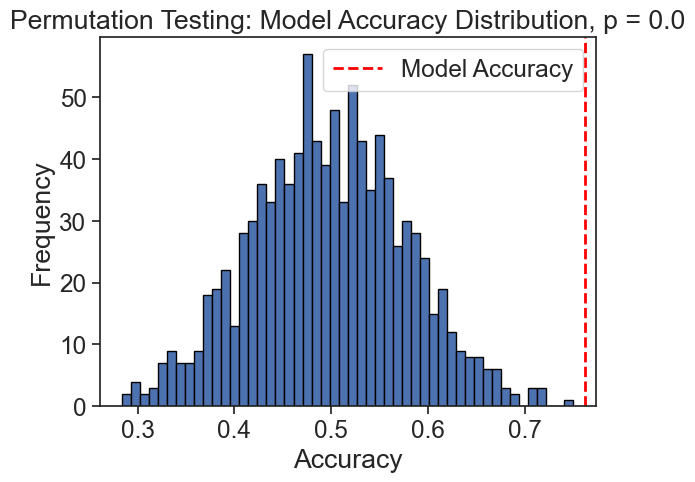

In [45]:
# run pls
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
import matplotlib.pyplot as plt
import bisect

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.metrics import roc_curve, roc_auc_score
from pyopls import OPLS
from sklearn.cross_decomposition import PLSRegression
from sklearn.model_selection import cross_val_predict, LeaveOneOut
from sklearn.metrics import r2_score, accuracy_score


def count_values_greater_than(sorted_list, target_value):
    # Use bisect_right to find the index of the first element greater than the target_value
    index = bisect.bisect_right(sorted_list, target_value)
    
    # The count of values greater than the target_value is the length of the list minus the index
    count = len(sorted_list) - index
    
    return count

def round_to_sign(value):
    if value >= 0:
        return np.ceil(value)
    else:
        return np.floor(value)

X = pd.read_csv('/scratch/gh8sj/brown_nsclc/data/output_data/q3_stage_target_neighbor_center_cell_act.csv', index_col=0)
y_str = X['stage']
X = X.drop(columns=['stage', 'patient'])
y = y_str.apply(lambda x: 1 if x == 'late' else -1)
X = stats.zscore(X, ddof = 1)
X = X.loc[:,X.columns.isin(selected_features)]

X









# do you orthogoranlize all the permutations? -> yes



# Generate some example data
np.random.seed(42)

# Split the data into training and testing sets
#X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)
opls = OPLS(2) # 1 components
Z = opls.fit_transform(X, y)
pls_model = PLSRegression(2)


pls_model.fit(Z, y)
#y_pred= pls.predict(X)
processed_y_pred = cross_val_predict(pls_model, Z, y, cv=5)

                           
processed_q_squared = r2_score(y, processed_y_pred) 
processed_dq_squared = r2_score(y, np.clip(processed_y_pred, -1, 1))  # 0.984
processed_accuracy = accuracy_score(y, np.sign(processed_y_pred))  # 1.0
processed_accuracy_rounded = round(processed_accuracy,2)

variance_in_x = np.var(pls_model.x_scores_, axis = 0) 
total_variance_in_x = np.var(Z, axis = 0)
# normalize variance by total variance:
#fractions_of_explained_variance = variance_in_x / total_variance_in_x

r2_X = opls.score(X)  # 7.8e-12 (most variance is removed)


# Number of permutations
num_permutations = 1000

# List to store permutation accuracies
permuted_accuracies = []

# Permutation testing loop
for _ in tqdm(range(num_permutations)):
    # Randomly permute the labels
    permuted_labels = np.random.permutation(y)
    
    
#processed_y_pred = cross_val_predict(pls, Z, y, cv=1000)
#processed_q_squared = r2_score(y, processed_y_pred)  # 0.981
#processed_dq_squared = r2_score(y, np.clip(processed_y_pred, -1, 1))  # 0.984
#processed_accuracy = accuracy_score(y, np.sign(processed_y_pred))  # 1.0
    opls = OPLS(2) # 1 components
    Z_i = opls.fit_transform(X, permuted_labels)

    #permuted_model.fit(X, permuted_labels)
    pls = PLSRegression(1)
    permuted_pred = cross_val_predict(pls, Z_i, permuted_labels, cv=5) # I should change this to something smaller, leave one out would literally take foever
    # Make predictions with the permuted model
    #permuted_predictions = permuted_model.predict(X)
    
    # Calculate accuracy and store in the list
    permuted_pred = [round_to_sign(value) for value in permuted_pred]# Round each value in the list based on the specified rules


    permuted_accuracy = accuracy_score(y, permuted_pred)
    permuted_accuracies.append(permuted_accuracy)

    
permuted_accuracies = pd.Series(np.sort(permuted_accuracies), index = range(1000))
result_count = count_values_greater_than(permuted_accuracies, processed_accuracy)
p = 1-(1000-result_count)/1000
p_round = round(p,3)

# Plotting the histogram
plt.hist(permuted_accuracies, bins=50, edgecolor='black')
plt.axvline(x=processed_accuracy, color='red', linestyle='dashed', linewidth=2, label='Model Accuracy')
plt.xlabel('Accuracy')
plt.ylabel('Frequency')
plt.title(f'Permutation Testing: Model Accuracy Distribution, p = {p}')
plt.legend()
plt.show()

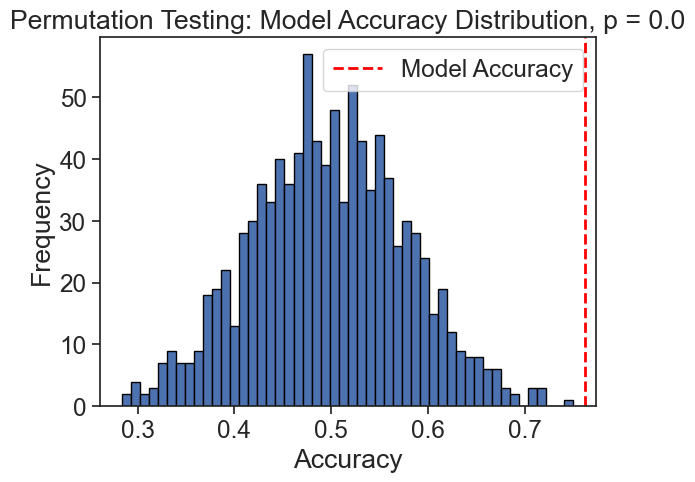

In [46]:

# Plotting the histogram
plt.hist(permuted_accuracies, bins=50, edgecolor='black')
plt.axvline(x=processed_accuracy, color='red', linestyle='dashed', linewidth=2, label='Model Accuracy')
plt.xlabel('Accuracy')
plt.ylabel('Frequency')
plt.title(f'Permutation Testing: Model Accuracy Distribution, p = {p_round}')
plt.legend()
#plt.savefig('/home/gh8sj/projects/gabe_kate_method/figures/nsclc/final_figures/fig_S6a_permutations.pdf',format='pdf')
#plt.savefig('/home/gh8sj/projects/gabe_kate_method/figures/nsclc/final_figures/fig_S6a_permutations.png',format='png', bbox_inches = 'tight')
plt.savefig('/scratch/gh8sj/kate_gabe_paper_figures/figure5/figS5a.pdf', format = 'pdf', bbox_inches = 'tight')

plt.show()

## 
## Matlab version - paste in here

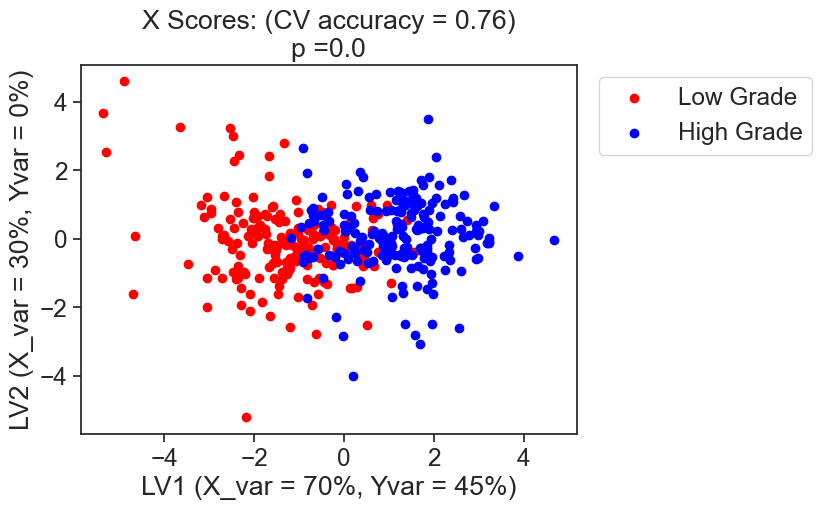

In [47]:
#plt.figure(1)
#df = pd.DataFrame(np.column_stack([pls_model.x_scores_, opls.T_ortho_[:, 0]]),
#                  index=y.index, columns=['t', 't_ortho'])                
df = pd.DataFrame(np.column_stack([pls_model.x_scores_]),
                  index=y.index, columns=['lv1', 'lv2'])       
pos_df = df[y==1]
neg_df = df[y==-1]
plt.scatter(neg_df['lv1'], neg_df['lv2'], c='red', label='Low Grade')
plt.scatter(pos_df['lv1'], pos_df['lv2'], c='blue', label='High Grade')
plt.title(f'X Scores: (CV accuracy = {processed_accuracy_rounded})\np ={p_round}')
plt.xlabel('LV1 (X_var = 70%, Yvar = 45%)')
plt.ylabel('LV2 (X_var = 30%, Yvar = 0%)')
plt.legend(bbox_to_anchor = (1.5,1))
#plt.savefig('/home/gh8sj/projects/gabe_kate_method/figures/nsclc/final_figures/fig_6c_scores.pdf',format='pdf',bbox_inches = 'tight')
plt.savefig('/scratch/gh8sj/kate_gabe_paper_figures/figure5/fig5c.pdf', format = 'pdf', bbox_inches = 'tight')

plt.show()

Text(0.5, 1.0, 'Loadings for oPLSDA model')

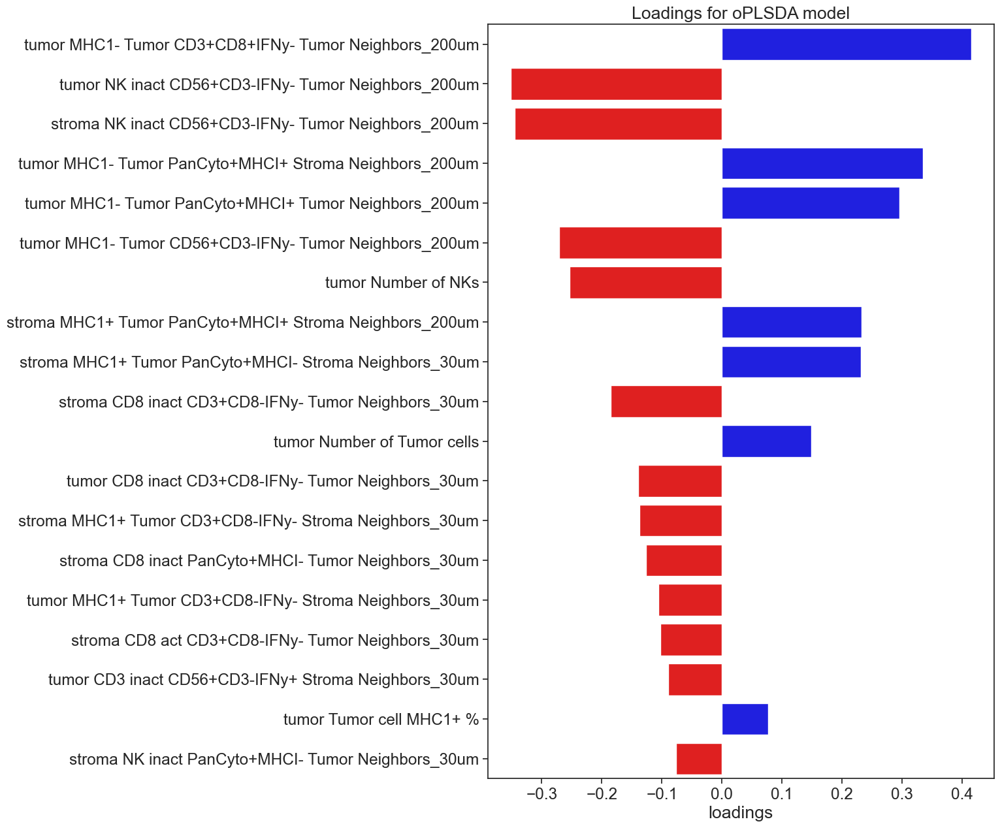

In [48]:
plt.figure(figsize=(10, 15)) 
x_loadings = pd.DataFrame(pls_model.x_loadings_[:,0].flatten(), index= X.columns, columns = ['loadings'])
x_loadings['color'] = np.where(x_loadings['loadings'] > 0, 'blue', 'red')
colors = {'red': 'red', 'blue': 'blue'}

x_loadings['abs_val'] = abs(x_loadings['loadings'])
x_loadings = x_loadings.sort_values(by = 'abs_val', ascending=False)
sns.barplot(data = x_loadings, x=x_loadings['loadings'],y = x_loadings.index, hue = 'color', palette = colors)
plt.legend().set_visible(False)
plt.ylabel('')
plt.title('Loadings for oPLSDA model')
#plt.savefig('/home/gh8sj/projects/gabe_kate_method/figures/nsclc/final_figures/alt_q3_grade.pdf',format='pdf', bbox_inches = 'tight')

<Figure size 400x600 with 0 Axes>

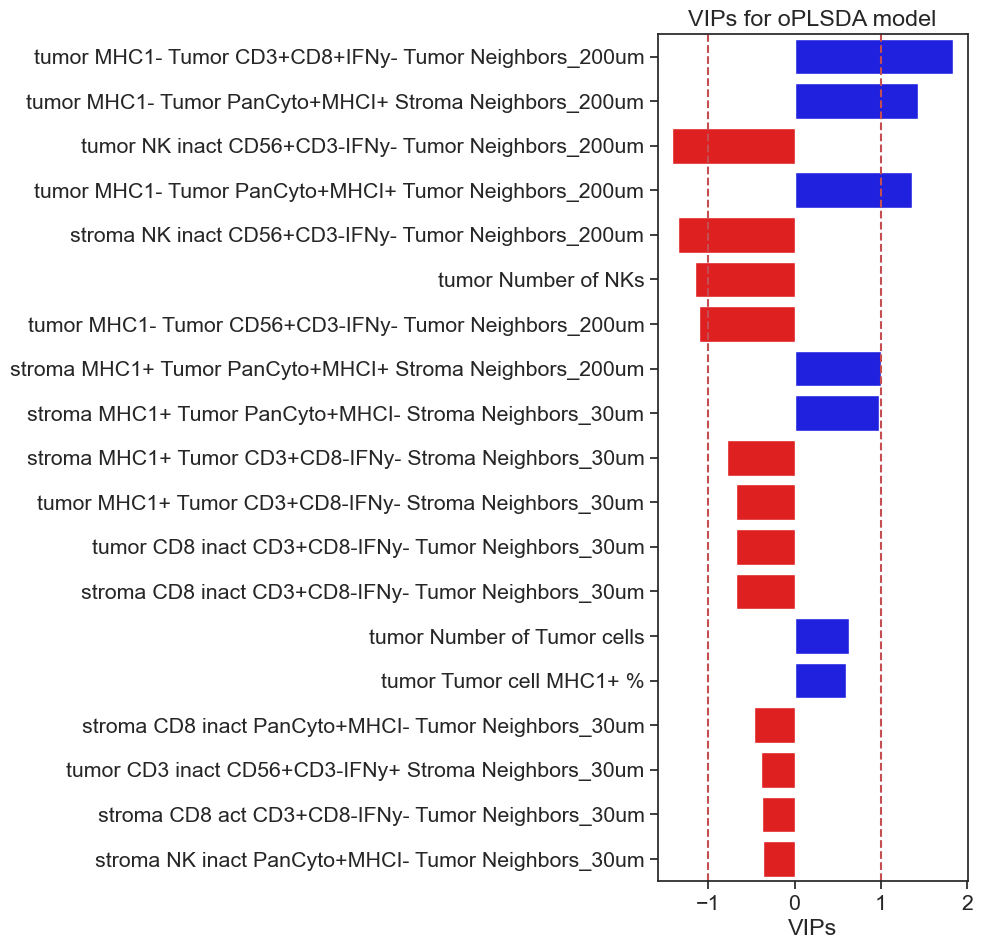

In [49]:

# lets try to make a VIP score with the same logic as Rem's code:
# Calculate VIP scores
def vip_efficient(model):
    t = model.x_scores_
    w = model.x_weights_ # replace with x_rotations_ if needed
    q = model.y_loadings_ 
    features_, _ = w.shape
    vip = np.zeros(shape=(features_,))
    inner_sum = np.diag(t.T @ t @ q.T @ q)
    SS_total = np.sum(inner_sum)
    vip = np.sqrt(features_*(w**2 @ inner_sum)/ SS_total)
    return vip

vips = vip_efficient(pls_model)



sns.set(font_scale = 1.4)
sns.set_style("ticks")
plt.figure(figsize=(4, 6)) 
plt.figure(figsize=(4, 11)) 

loadings_vips = pd.DataFrame(pls_model.x_loadings_[:,0].flatten(), index= X.columns, columns = ['loadings'])
loadings_vips['VIPs'] = vips
loadings_vips['color'] = np.where(loadings_vips['loadings'] > 0, 'short', 'long')
colors = {'short': 'blue', 'long': 'red'}

loadings_vips = loadings_vips.sort_values(by = 'VIPs', ascending=False)
for i in loadings_vips.index:
    if loadings_vips.loc[i,'loadings'] < 0:
        loadings_vips.loc[i,'VIPs'] = loadings_vips.loc[i,'VIPs']*-1
sns.barplot(data = loadings_vips, x=loadings_vips['VIPs'],y = loadings_vips.index, hue = 'color', palette = colors)
plt.axvline(x = -1, color = 'r', linestyle='--')
plt.axvline(x = 1, color = 'r', linestyle='--')
plt.legend().set_visible(False)
plt.ylabel('')
plt.title('VIPs for oPLSDA model')
#plt.savefig('/home/gh8sj/projects/gabe_kate_method/figures/nsclc/final_figures/fig_6d_VIPs.pdf',format='pdf', bbox_inches='tight')
plt.savefig('/scratch/gh8sj/kate_gabe_paper_figures/figure5/fig5d.pdf', format = 'pdf', bbox_inches = 'tight')
plt.show()

<Figure size 400x600 with 0 Axes>

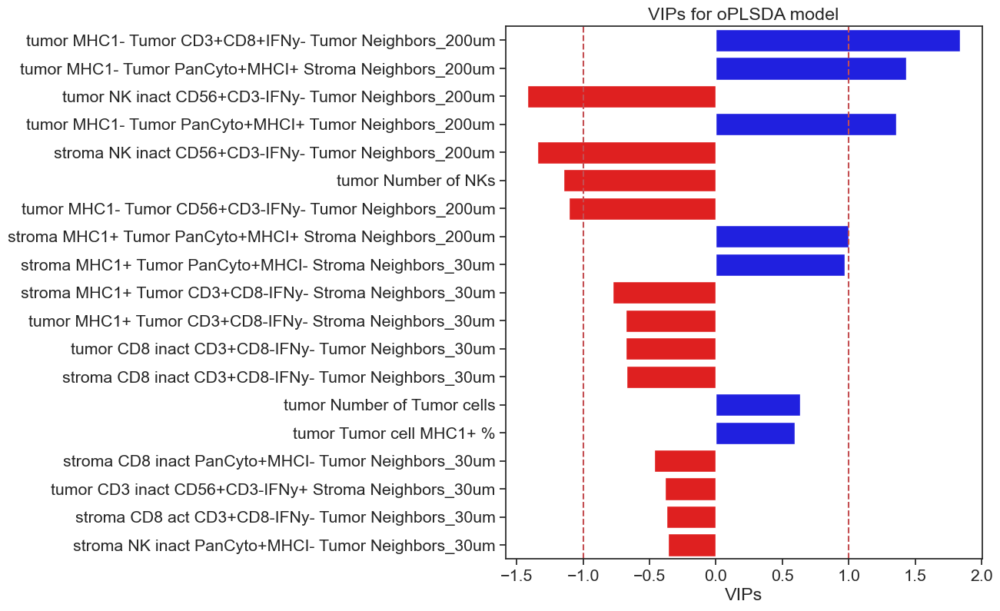

In [50]:

# lets try to make a VIP score with the same logic as Rem's code:
# Calculate VIP scores
def vip_efficient(model):
    t = model.x_scores_
    w = model.x_weights_ # replace with x_rotations_ if needed
    q = model.y_loadings_ 
    features_, _ = w.shape
    vip = np.zeros(shape=(features_,))
    inner_sum = np.diag(t.T @ t @ q.T @ q)
    SS_total = np.sum(inner_sum)
    vip = np.sqrt(features_*(w**2 @ inner_sum)/ SS_total)
    return vip

vips = vip_efficient(pls_model)



sns.set(font_scale = 1.4)
sns.set_style("ticks")
plt.figure(figsize=(4, 6)) 
plt.figure(figsize=(8, 9)) 

loadings_vips = pd.DataFrame(pls_model.x_loadings_[:,0].flatten(), index= X.columns, columns = ['loadings'])
loadings_vips['VIPs'] = vips
loadings_vips['color'] = np.where(loadings_vips['loadings'] > 0, 'short', 'long')
colors = {'short': 'blue', 'long': 'red'}

loadings_vips = loadings_vips.sort_values(by = 'VIPs', ascending=False)
for i in loadings_vips.index:
    if loadings_vips.loc[i,'loadings'] < 0:
        loadings_vips.loc[i,'VIPs'] = loadings_vips.loc[i,'VIPs']*-1
sns.barplot(data = loadings_vips, x=loadings_vips['VIPs'],y = loadings_vips.index, hue = 'color', palette = colors)
plt.axvline(x = -1, color = 'r', linestyle='--')
plt.axvline(x = 1, color = 'r', linestyle='--')
plt.legend().set_visible(False)
plt.ylabel('')
plt.title('VIPs for oPLSDA model')
#plt.savefig('/home/gh8sj/projects/gabe_kate_method/figures/nsclc/final_figures/fig_6d_VIPs.pdf',format='pdf', bbox_inches='tight')
plt.show()

##
### Matlab version

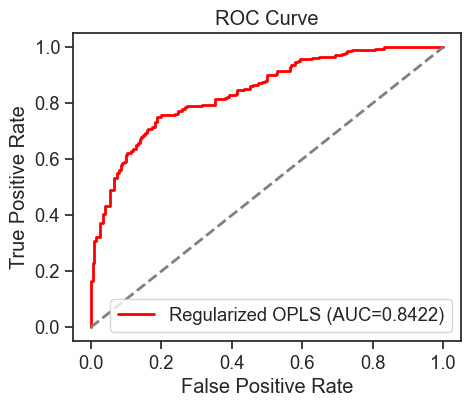

In [51]:
# ROC curve
import matplotlib.colors as colors
sns.set(font_scale = 1.2)
sns.set_style("ticks")
plt.figure(figsize=(5, 4)) 

proc_fpr, proc_tpr, proc_thresholds = roc_curve(y, processed_y_pred)
proc_roc_auc = roc_auc_score(y, processed_y_pred)

plt.plot(proc_fpr, proc_tpr, lw=2, color='red',
         label=f'Regularized OPLS (AUC={proc_roc_auc:.4f})')
plt.plot([0, 1], [0, 1], color='gray', lw=2, linestyle='--')
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('ROC Curve')
plt.legend(loc='lower right')
#plt.savefig('/home/gh8sj/projects/gabe_kate_method/figures/nsclc/final_figures/fig_S6a_ROC.pdf',format='pdf')
#plt.savefig('/home/gh8sj/projects/gabe_kate_method/figures/nsclc/final_figures/fig_S6a_ROC.png',format='png',  bbox_inches = 'tight')
plt.savefig('/scratch/gh8sj/kate_gabe_paper_figures/figure5/figS5b.pdf', format = 'pdf', bbox_inches = 'tight')

plt.show()

# checkpoint univariate analysis 

In [52]:
results_df = pd.read_csv('/scratch/gh8sj/brown_nsclc/data/output_data/q3_stage_target_neighbor_center_cell_act.csv', index_col=0)


In [53]:
cols_to_keep = loadings_vips[1:7].index
melted_df = results_df.melt(id_vars = ['stage','patient'], value_vars= cols_to_keep)
melted_df
groups = sorted(melted_df['stage'].unique(), reverse=False)
groups


['early', 'late']

/tmp/ipykernel_545791/2044838539.py:46: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(data=X, x='stage', y=cols_to_keep, alpha=0.5, legend=False,
/tmp/ipykernel_545791/2044838539.py:59: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[i].set_xticklabels(['Low Grade', 'High Grade'])
/tmp/ipykernel_545791/2044838539.py:46: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(data=X, x='stage', y=cols_to_keep, alpha=0.5, legend=False,
/tmp/ipykernel_545791/2044838539.py:59: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[i].s

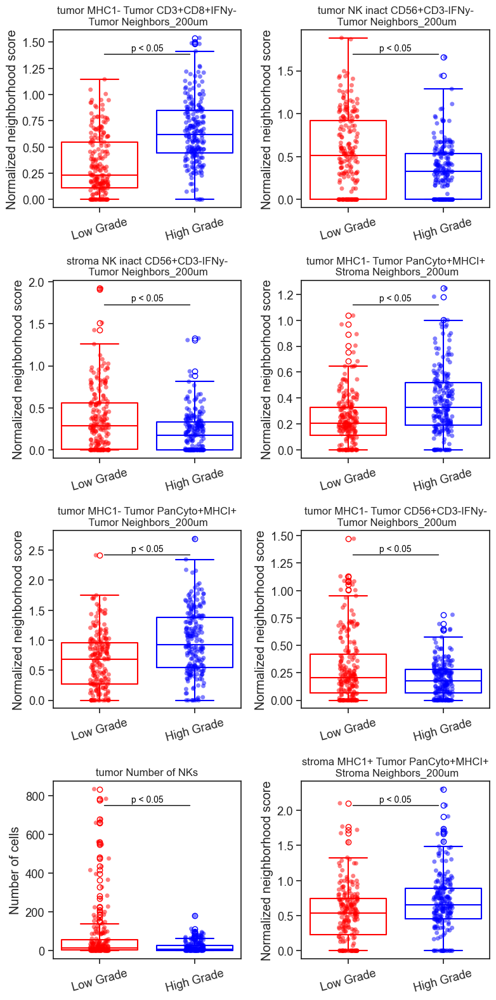

In [57]:
# Same plots done 2 different layouts 

import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import mannwhitneyu

# Set seaborn style and font scale
sns.set(font_scale=1.2)
sns.set_style("ticks")

# Create a figure with subplots
fig, axes = plt.subplots(4, 2, figsize=(8, 16))
fig.subplots_adjust(hspace=0.4, wspace=0.4)



# Flatten the axes array for easier iteration
axes = axes.flatten()

X = pd.read_csv('/scratch/gh8sj/brown_nsclc/data/output_data/q3_stage_target_neighbor_center_cell_act.csv', index_col=0)

# Function to perform Wilcoxon test and add significance bars
def add_significance_bars(group1, group2, ax):
    statistic, p_value = mannwhitneyu(group1, group2)
    if p_value < 0.05:
        max_y = max(max(group1), max(group2))
        significance_height = max_y - 0.1 * max_y  # Adjust the height of significance bars relative to the maximum y-value
        ax.plot([0.05, 0.95], [significance_height, significance_height], color='black', lw=1)  # Adjust the thickness of significance bars
        ax.text(0.5, significance_height * 1.01, 'p < 0.05', ha='center', va='bottom', color='black', fontsize=10)


# Iterate over the first four items in x_loadings index
for i, col in enumerate(x_loadings.index[:8]):
    # Subset the melted DataFrame for the current column
    melted_df = X.melt(id_vars=['stage', 'patient'], value_vars=[col])
    
    # Draw violin plot for the current column on the corresponding subplot
    cols_to_keep = col
    melted_df = X.melt(id_vars = ['stage','patient'], value_vars= cols_to_keep)
    groups = sorted(melted_df['stage'].unique(), reverse=True)
    
    sns.boxplot(data=X, x='stage', y=cols_to_keep, hue_order=groups, hue='stage',
                fill=False, palette={"early": "red", "late": "blue"}, legend=True, ax=axes[i])
    
    sns.stripplot(data=X, x='stage', y=cols_to_keep, alpha=0.5, legend=False,
                  palette={"early": "red", "late": "blue"}, ax=axes[i])  # Jitterplot

    # Remove legend
    axes[i].legend().remove()
    
    # Rotate x-axis labels
    axes[i].tick_params(axis='x', rotation=15)
    
    # Set x-axis and y-axis labels
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')
    #axes[i].set_ylim(0, 1.7)
    axes[i].set_xticklabels(['Low Grade', 'High Grade'])
    
    # Set x-axis and y-axis labels
    axes[i].set_xlabel('')
    if 'Neighbors' in col:
        axes[i].set_ylabel('Normalized neighborhood score')
    elif 'Number' in col:
        axes[i].set_ylabel('Number of cells')
    else:
        axes[i].set_ylabel('Percentage')
    
    split_index = col.find('IFNy-')
    if split_index != -1:
        title_lines = [col[:split_index + 5], col[split_index + 5:]]
        axes[i].set_title('\n'.join(title_lines), size=12)
    else:
        split_index = col.find('MHCI+')
        if split_index != -1:
            title_lines = [col[:split_index + 5], col[split_index + 5:]]
            axes[i].set_title('\n'.join(title_lines), size=12)
            title_lines = [col[:split_index + 5], col[split_index + 5:]]
            axes[i].set_title('\n'.join(title_lines), size=12)
        else:
            axes[i].set_title(col, size=12)
    
    # Perform Wilcoxon test and add significance bars
    group1 = X[X['stage'] == "early"][col]
    group2 = X[X['stage'] == "late"][col]
    add_significance_bars(group1, group2, axes[i])

# Adjust layout
plt.tight_layout()
#plt.savefig('/home/gh8sj/projects/gabe_kate_method/figures/nsclc/final_figures/fig_6e_univariate.pdf', format='pdf')
#plt.savefig('/home/gh8sj/projects/gabe_kate_method/figures/nsclc/final_figures/fig_6e_univariate.png', format='png')
plt.savefig('/scratch/gh8sj/kate_gabe_paper_figures/figure5/fig5ee.pdf', format = 'pdf', bbox_inches = 'tight')

# Show the plot
plt.show()

/tmp/ipykernel_545791/3094199427.py:44: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(data=X, x='stage', y=cols_to_keep, alpha=0.5, legend=False,
/tmp/ipykernel_545791/3094199427.py:57: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[i].set_xticklabels(['Low Grade', 'High Grade'])
/tmp/ipykernel_545791/3094199427.py:44: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  sns.stripplot(data=X, x='stage', y=cols_to_keep, alpha=0.5, legend=False,
/tmp/ipykernel_545791/3094199427.py:57: UserWarning: set_ticklabels() should only be used with a fixed number of ticks, i.e. after set_ticks() or using a FixedLocator.
  axes[i].s

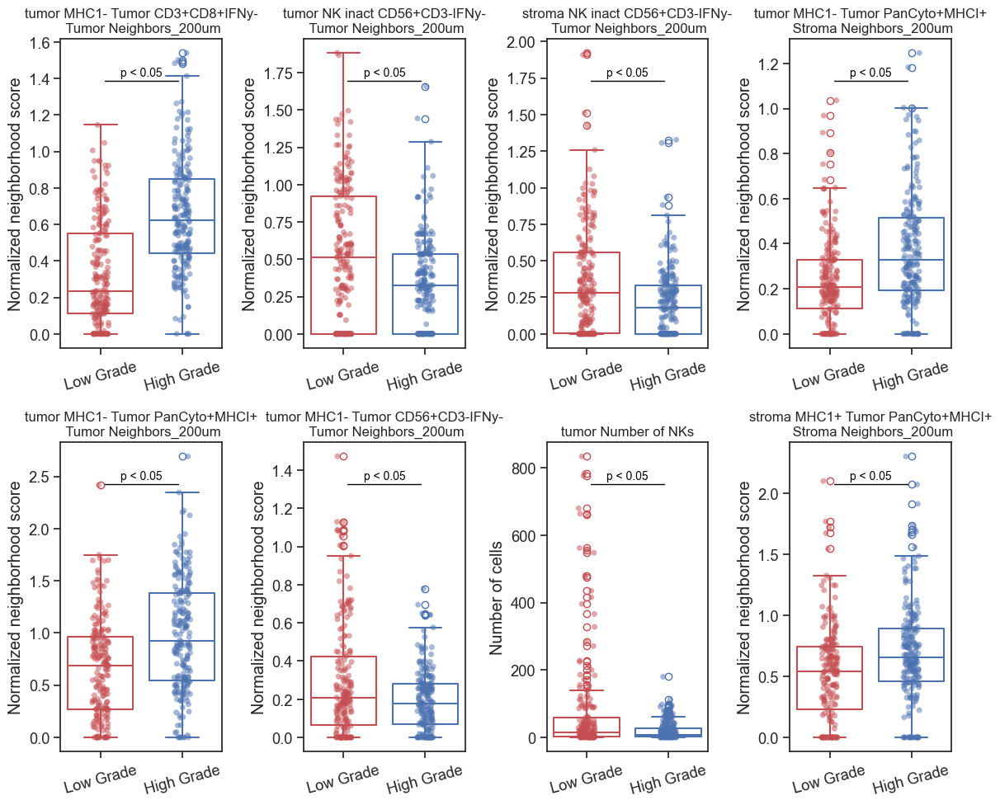

In [58]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
from scipy.stats import mannwhitneyu

# Set seaborn style and font scale
sns.set(font_scale=1.2)
sns.set_style("ticks")

# Create a figure with subplots
fig, axes = plt.subplots(2, 4, figsize=(12, 10))
fig.subplots_adjust(hspace=0.4, wspace=0.4)



# Flatten the axes array for easier iteration
axes = axes.flatten()

X = pd.read_csv('/scratch/gh8sj/brown_nsclc/data/output_data/q3_stage_target_neighbor_center_cell_act.csv', index_col=0)

# Function to perform Wilcoxon test and add significance bars
def add_significance_bars(group1, group2, ax):
    statistic, p_value = mannwhitneyu(group1, group2)
    if p_value < 0.05:
        max_y = max(max(group1), max(group2))
        significance_height = max_y - 0.1 * max_y  # Adjust the height of significance bars relative to the maximum y-value
        ax.plot([0.05, 0.95], [significance_height, significance_height], color='black', lw=1)  # Adjust the thickness of significance bars
        ax.text(0.5, significance_height * 1.01, 'p < 0.05', ha='center', va='bottom', color='black', fontsize=10)


# Iterate over the first four items in x_loadings index
for i, col in enumerate(x_loadings.index[:8]):
    # Subset the melted DataFrame for the current column
    melted_df = X.melt(id_vars=['stage', 'patient'], value_vars=[col])
    
    # Draw violin plot for the current column on the corresponding subplot
    cols_to_keep = col
    melted_df = X.melt(id_vars = ['stage','patient'], value_vars= cols_to_keep)
    groups = sorted(melted_df['stage'].unique(), reverse=True)
    
    sns.boxplot(data=X, x='stage', y=cols_to_keep, hue_order=groups, hue='stage',
                fill=False, palette={"early": "r", "late": "b"}, legend=True, ax=axes[i])
    
    sns.stripplot(data=X, x='stage', y=cols_to_keep, alpha=0.5, legend=False,
                  palette={"early": "r", "late": "b"}, ax=axes[i])  # Jitterplot

    # Remove legend
    axes[i].legend().remove()
    
    # Rotate x-axis labels
    axes[i].tick_params(axis='x', rotation=15)
    
    # Set x-axis and y-axis labels
    axes[i].set_xlabel('')
    axes[i].set_ylabel('')
    #axes[i].set_ylim(0, 1.7)
    axes[i].set_xticklabels(['Low Grade', 'High Grade'])
    
    # Set x-axis and y-axis labels
    axes[i].set_xlabel('')
    if 'Neighbors' in col:
        axes[i].set_ylabel('Normalized neighborhood score')
    elif 'Number' in col:
        axes[i].set_ylabel('Number of cells')
    else:
        axes[i].set_ylabel('Percentage')
    
    split_index = col.find('IFNy-')
    if split_index != -1:
        title_lines = [col[:split_index + 5], col[split_index + 5:]]
        axes[i].set_title('\n'.join(title_lines), size=12)
    else:
        split_index = col.find('MHCI+')
        if split_index != -1:
            title_lines = [col[:split_index + 5], col[split_index + 5:]]
            axes[i].set_title('\n'.join(title_lines), size=12)
            title_lines = [col[:split_index + 5], col[split_index + 5:]]
            axes[i].set_title('\n'.join(title_lines), size=12)
        else:
            axes[i].set_title(col, size=12)
    
    # Perform Wilcoxon test and add significance bars
    group1 = X[X['stage'] == "early"][col]
    group2 = X[X['stage'] == "late"][col]
    add_significance_bars(group1, group2, axes[i])

# Adjust layout
plt.tight_layout()
plt.savefig('/home/gh8sj/projects/gabe_kate_method/figures/nsclc/final_figures/fig_6e_univariate.pdf', format='pdf')
plt.savefig('/home/gh8sj/projects/gabe_kate_method/figures/nsclc/final_figures/fig_6e_univariate.png', format='png')

# Show the plot
plt.show()

# Checkpoint - finding the representative figure

In [59]:
df = pd.read_csv("/scratch/gh8sj/brown_nsclc/data/neighbor_data/tumor_stroma/tumor_stroma_merged_neighbor_data.csv", index_col=0)

In [60]:
list(df.columns)

['Slide Index',
 'ImageLocation',
 'XMin',
 'XMax',
 'YMin',
 'YMax',
 'MHCI',
 'CD56',
 'CD8',
 'CD3',
 'IFNy',
 'IFNy (Opal 620) Cytoplasm Intensity',
 'PanCyto',
 'ClassifierLabel',
 'ROI',
 'PatientID',
 'XCenter',
 'YCenter',
 'CellArea',
 'Cytoplasm Area (µm²)',
 'Membrane Area (µm²)',
 'Nucleus Area (µm²)',
 'Nucleus Perimeter (µm)',
 'Nucleus Roundness',
 'CD56+PanCyto-',
 'CD56+CD3-',
 'PanCyto+CD3-',
 'PanCyto+MHCI+',
 'PanCyto+MHCI-',
 'PanCyto-CD56-',
 'CD3+CD8-',
 'CD3+CD8+',
 'CD3+CD8+IFNy+',
 'CD3+CD8+IFNy-',
 'CD3+CD8-IFNy+',
 'CD3+CD8-IFNy-',
 'CD56+CD3-IFNy+',
 'CD56+CD3-IFNy-',
 'CD3+CD8+IFNy+ Tumor_30um',
 'CD3+CD8+IFNy+ Stroma_30um',
 'CD3+CD8+IFNy+ Glass_30um',
 'CD3+CD8+IFNy- Tumor_30um',
 'CD3+CD8+IFNy- Stroma_30um',
 'CD3+CD8+IFNy- Glass_30um',
 'CD3+CD8-IFNy+ Tumor_30um',
 'CD3+CD8-IFNy+ Stroma_30um',
 'CD3+CD8-IFNy+ Glass_30um',
 'CD3+CD8-IFNy- Tumor_30um',
 'CD3+CD8-IFNy- Stroma_30um',
 'CD3+CD8-IFNy- Glass_30um',
 'CD56+CD3-IFNy+ Tumor_30um',
 'CD56+CD3-IFN

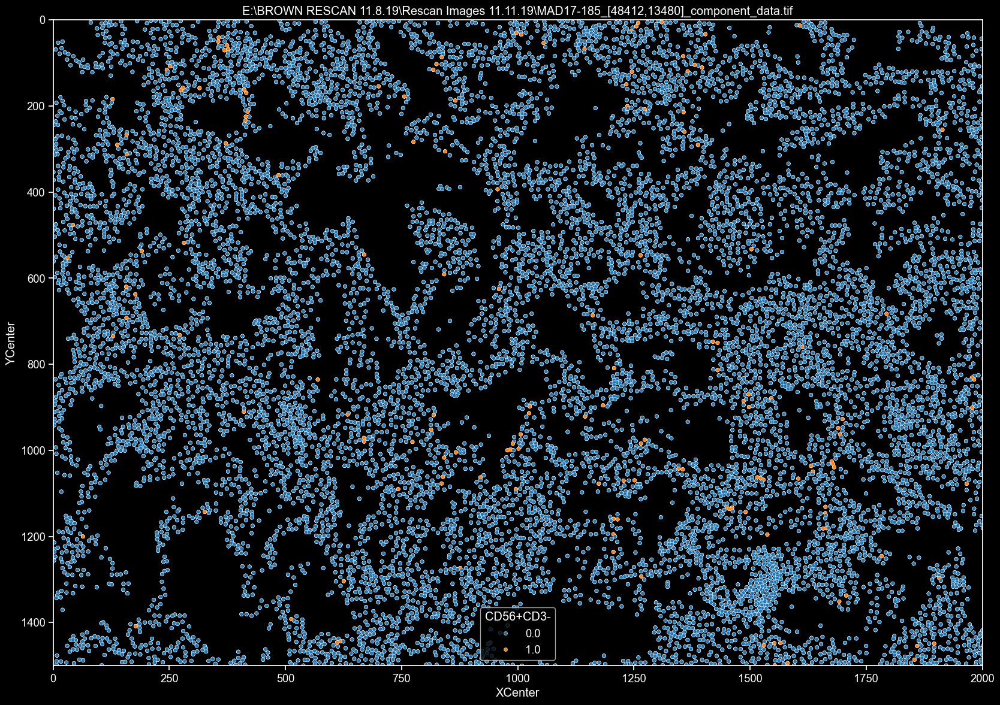

In [53]:
# NK cells
plt.style.use('dark_background')
ex_df = df[df['ImageLocation'] ==  list(df['ImageLocation'].unique())[6]]
plt.figure(figsize=(20,14))
sns.scatterplot(data = ex_df, x = 'XCenter', y = 'YCenter', hue= 'CD56+CD3-', s=20, palette = 'tab10')
plt.title(list(ex_df['ImageLocation'].unique())[0])  
plt.ylim(0, 1500)
plt.xlim(0, 2000)
plt.gca().invert_yaxis() 

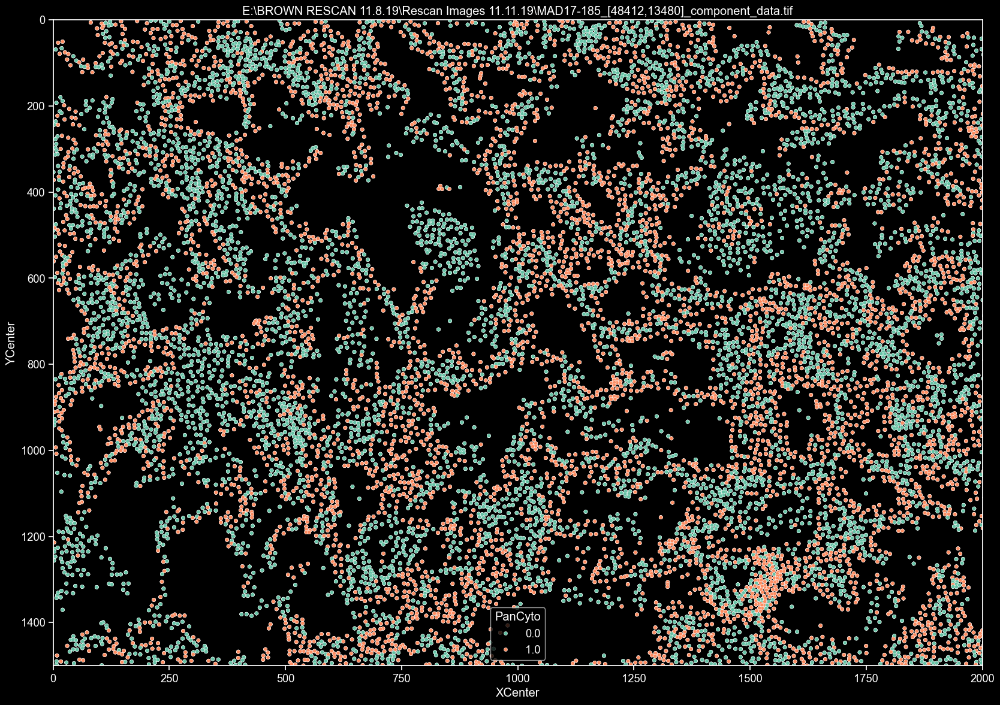

In [62]:
# PanCK+ 
plt.style.use('dark_background')
ex_df = df[df['ImageLocation'] ==  list(df['ImageLocation'].unique())[6]]
plt.figure(figsize=(20,14))
sns.scatterplot(data = ex_df, x = 'XCenter', y = 'YCenter', hue= 'PanCyto', s=20, palette = 'Set2')
plt.title(list(ex_df['ImageLocation'].unique())[0])  
plt.ylim(0, 1500)
plt.xlim(0, 2000)
plt.gca().invert_yaxis() 

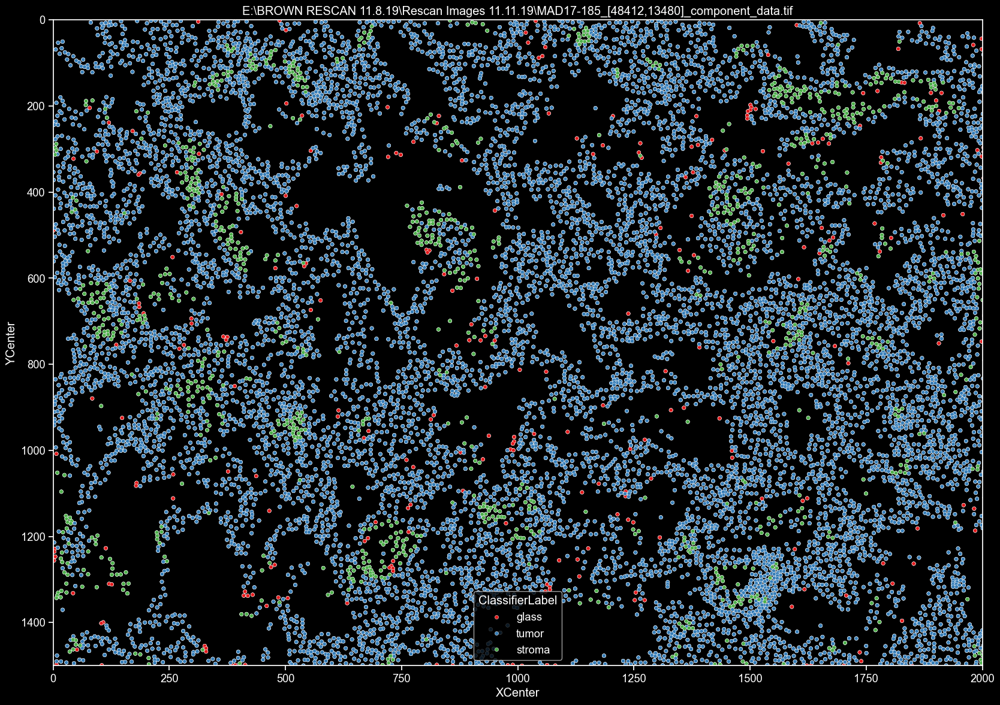

In [61]:
# Classifier label 
plt.style.use('dark_background')
ex_df = df[df['ImageLocation'] ==  list(df['ImageLocation'].unique())[6]]
plt.figure(figsize=(20,14))
sns.scatterplot(data = ex_df, x = 'XCenter', y = 'YCenter', hue= 'ClassifierLabel', s=20, palette = 'Set1')
plt.title(list(ex_df['ImageLocation'].unique())[0])  
plt.ylim(0, 1500)
plt.xlim(0, 2000)
plt.gca().invert_yaxis() 

Text(0.5, 1.05, 'Test patient: E:\\BROWN RESCAN 11.8.19\\Rescan Images 11.11.19\\MAD17-185_[48412,13480]_component_data.tif')

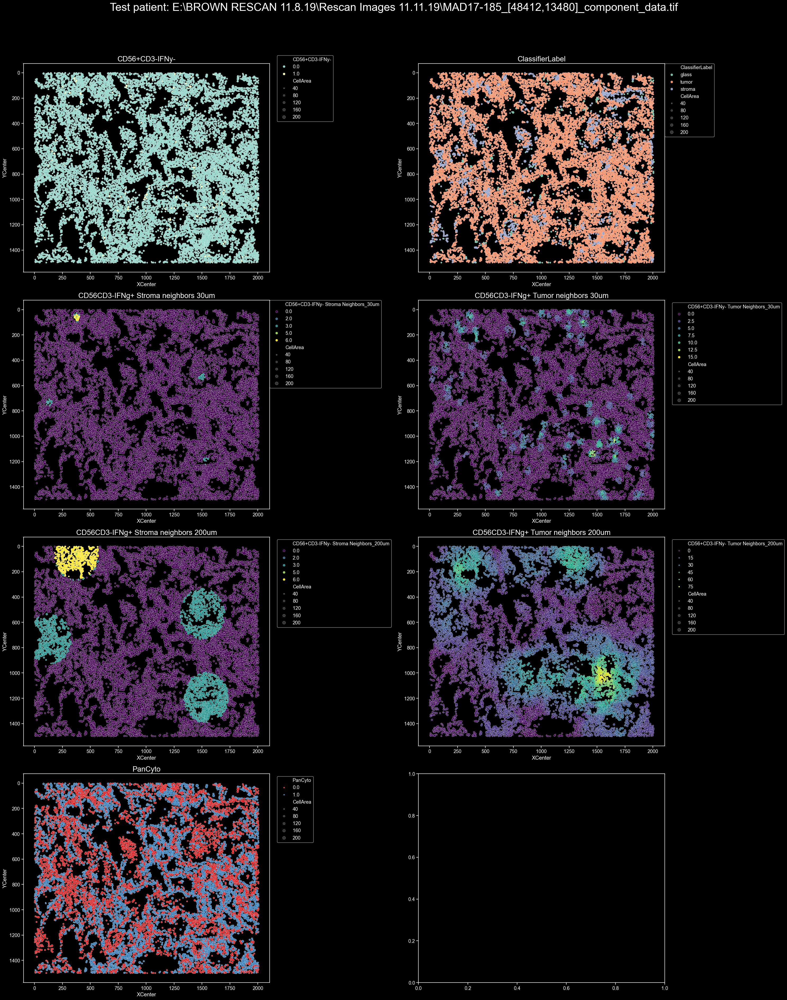

In [64]:
# representative image
## A) IFNg- NK cells 
## B) Cells by classifier label tumor/stroma/glass 
## C) Cells colored by number of stromal IFNg- NK Cell neighbors at 30 um
## D) Cells colored by number of tumoral IFNg- NK Cell neighbors at 30 um
## E) Cells colored by number of Stromal IFNg- NK Cell neighbors at 200 um
## F) Cells colored by number of tumoral IFNg- NK Cell neighbors at 200 um
## G) Cells by PanCK
patient =  list(df['ImageLocation'].unique())[6]
colormap = {
    'glass': 'grey',
    'stroma': 'pink',
    'tumor': 'purple'
}
plt.style.use('dark_background')

fig, axes = plt.subplots(4, 2, figsize=(30,36))
#fig.subplots_adjust(wspace=0.5, hspace = 0.2)

ax0 = sns.scatterplot(ax = axes[0,0], data = ex_df, x = 'XCenter', y = 'YCenter', hue= 'CD56+CD3-IFNy-',  palette = 'Set3', size='CellArea', sizes=(2.5, 75))
ax0.set_title('CD56+CD3-IFNy-', fontsize = 20)  
ax0.legend(bbox_to_anchor=(1.02, 1.05))
#ax0.get_legend().remove()
#ax0.set_ylim(0, 500)
#ax0.set_xlim(0, 1000)
ax0.invert_yaxis()

,

ax1 = sns.scatterplot(ax = axes[0,1], data =ex_df, x = 'XCenter', y = 'YCenter', hue= 'ClassifierLabel', palette = 'Set2',  size='CellArea',sizes=(2.5, 75))
ax1.set_title('ClassifierLabel', fontsize = 20)  
ax1.legend(bbox_to_anchor=(1, 1), loc='upper left', borderaxespad=0)
#ax1.get_legend().remove()
#ax1.set_ylim(0, 1500)
#ax1.set_xlim(0, 2000)
ax1.invert_yaxis()

ax2 = sns.scatterplot(ax = axes[1,0], data = ex_df, x = 'XCenter', y = 'YCenter', hue= 'CD56+CD3-IFNy- Stroma Neighbors_30um', palette = 'viridis', size='CellArea', sizes=(2.5, 75))
ax2.set_title('CD56CD3-IFNg+ Stroma neighbors 30um', fontsize = 20)  
ax2.legend(bbox_to_anchor=(1, 1), loc='upper left', borderaxespad=0)
#ax2.get_legend().remove()
#ax2.set_ylim(0, 1500)
#ax2.set_xlim(0, 2000)
ax2.invert_yaxis()

ax3 = sns.scatterplot(ax = axes[1,1], data = ex_df, x = 'XCenter', y = 'YCenter', hue= 'CD56+CD3-IFNy- Tumor Neighbors_30um', palette = 'viridis', size='CellArea', sizes=(2.5, 75))
ax3.set_title('CD56CD3-IFNg+ Tumor neighbors 30um', fontsize = 20)  
ax3.legend(bbox_to_anchor=(1.02, 1))
#ax3.get_legend().remove()
#ax3.set_ylim(0, 1500)
#ax3.set_xlim(0, 2000)
ax3.invert_yaxis()

ax4 = sns.scatterplot(ax = axes[2,0], data = ex_df, x = 'XCenter', y = 'YCenter', hue= 'CD56+CD3-IFNy- Stroma Neighbors_200um', palette = 'viridis',  size='CellArea', sizes=(2.5, 75))
ax4.set_title('CD56CD3-IFNg+ Stroma neighbors 200um', fontsize = 20)
ax4.legend(bbox_to_anchor=(1.02, 1))
#ax4.get_legend().remove()
#ax3.set_ylim(0, 1500)
#ax3.set_xlim(0, 2000)
ax4.invert_yaxis()

ax5 = sns.scatterplot(ax = axes[2,1], data =ex_df, x = 'XCenter', y = 'YCenter', hue= 'CD56+CD3-IFNy- Tumor Neighbors_200um', palette = 'viridis', s=10, size='CellArea',sizes=(2.5, 75))
#ax5.get_legend()
ax5.legend(bbox_to_anchor=(1.02, 1))
#ax5.get_legend().remove()
ax5.set_title('CD56CD3-IFNg+ Tumor neighbors 200um', fontsize = 20)  
#ax3.set_ylim(0, 1500)
#ax3.set_xlim(0, 2000)
ax5.invert_yaxis()


ax6 = sns.scatterplot(ax = axes[3,0], data =ex_df, x = 'XCenter', y = 'YCenter', hue= 'PanCyto', palette = 'Set1', s=10, size='CellArea',sizes=(2.5, 75))
#ax5.get_legend()
ax6.legend(bbox_to_anchor=(1.02, 1))
#ax5.get_legend().remove()
ax6.set_title('PanCyto', fontsize = 20)  
#ax3.set_ylim(0, 1500)
#ax3.set_xlim(0, 2000)
ax6.invert_yaxis()

plt.tight_layout()
fig.suptitle(f'Test patient: {patient}', fontsize=30, y=1.05)
#plt.savefig('vectra_analysis_results/recreated_images/intensity_stains.png', bbox_inches = 'tight')
#sns.boxplot(data=df, x='team', y='points', ax=axes[0,0])
#sns.boxplot(data=df, x='team', y='assists', ax=axes[0,1])
#sns.boxplot(data=df, x='team', y='rebounds', ax=axes[1,0])
#sns.boxplot(data=df, x='team', y='blocks', ax=axes[1,1])